# Data Science Competition

# Predicting Delivery Time

## Environment Setup

In [1]:
#load important libraries
import numpy as np
import pandas as pd
import pandas_profiling
import datetime
import math as m

# plotting libraries
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# ML libraries
import os
from sklearn import metrics
from sklearn import preprocessing
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score, cross_val_predict, train_test_split

# styling
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>")) # Increase cell width
display(HTML("<style>.rendered_html { font-size: 16px; }</style>")) # Increase font size
plt.style.use("fivethirtyeight")
sns.set_style('whitegrid')
sns.set_context('talk')

## Reading the File

In [2]:
main_df = pd.read_csv('train_main.csv', index_col="id",) #parse_dates=["starting_time"])
main_df.head()

,id,starting_time,model_van,num_packages,delivery_time
0,1,2016/04/14 20:53:00,model_A,3,448
1,2,2016/05/30 23:12:00,model_B,1,784
2,3,2016/03/03 11:54:00,model_B,1,844
3,4,2016/05/02 12:34:00,model_A,1,2076
4,5,2016/03/02 15:53:00,model_A,1,1289


In [3]:
geo_df = pd.read_csv('train_geo.csv', index_col="id")
geo_df.head()

,town,start_Longitude,start_Latitude,end_Longitude,end_Latitude
id,,,,,
7195,Hawkins,-73.957771,40.717770,-73.926498,40.705521
4844,Hawkins,-73.973984,40.750404,-73.872925,40.774326
2402,Hawkins,-73.977150,40.751656,-73.981308,40.782711
6996,Hawkins,-73.984489,40.736862,-73.960564,40.769562
4207,Hawkins,-73.976616,40.790688,-73.974281,40.783520


In [4]:
weather_df = pd.read_csv('train_weather.csv', index_col="id")
weather_df.head()

,wea_conditions,wea_temp,wea_dptemp,wea_humidity,wea_windspeed,wea_winddir,wea_visibility,wea_pressure,wea_precipitation,wea_fog,wea_rain,wea_snow
id,,,,,,,,,,,,
7322,Mostly_Cloudy,22.8,11.7,49.0,7.4,0,16.1,29.9,NaN,No,No,No
5677,Clear,12.8,-2.8,34.0,0.0,0,16.1,29.9,NaN,No,No,No
5269,Clear,16.7,-6.7,20.0,5.6,0,16.1,30.3,NaN,No,No,No
7334,Overcast,9.4,7.2,86.0,13.0,70,16.1,29.8,0.8,No,No,No
3356,Light_Rain,11.7,10.6,93.0,5.6,0,4.0,29.9,1.8,No,Y,No


In [5]:
gt_df = main_df.join(geo_df)

In [6]:
train_df = gt_df.join(weather_df)
train_df.head()

,starting_time,model_van,num_packages,delivery_time,town,start_Longitude,start_Latitude,end_Longitude,end_Latitude,wea_conditions,...,wea_dptemp,wea_humidity,wea_windspeed,wea_winddir,wea_visibility,wea_pressure,wea_precipitation,wea_fog,wea_rain,wea_snow
id,,,,,,,,,,,,,,,,,,,,,
1,2016/04/14 20:53:00,model_A,3,448,Hawkins,-73.950912,40.825974,-73.944740,40.814163,Clear,...,0.0,54.0,16.7,170,16.1,30.4,NaN,No,No,No
2,2016/05/30 23:12:00,model_B,1,784,Hawkins,-73.985680,40.760487,-73.942482,40.786232,Partly_Cloudy,...,18.9,79.0,9.3,0,16.1,30.0,NaN,No,No,No
3,2016/03/03 11:54:00,model_B,1,844,Hawkins,-73.985420,40.758389,-74.007294,40.726639,Clear,...,-15.6,31.0,9.3,250,16.1,30.2,NaN,No,No,No
4,2016/05/02 12:34:00,model_A,1,2076,Hawkins,-73.870964,40.773792,-73.989090,40.746052,Overcast,...,-1.7,85.0,13.0,300,4.0,30.1,NaN,No,No,No
5,2016/03/02 15:53:00,model_A,1,1289,Hawkins,-73.979012,40.745266,-73.979240,40.772480,Rain,...,12.2,89.0,11.1,170,1.6,30.0,5.1,No,Y,No


In [7]:
train_df = train_df.sort_values(by="starting_time")

## EDA

In [9]:
import warnings 
warnings.filterwarnings('ignore')

report = pandas_profiling.ProfileReport(train_df)
report

In [68]:
train_df1 = train_df.drop("town", axis='columns')

In [69]:
# Rename columns
train_df1.columns

Index(['starting_time', 'model_van', 'num_packages', 'delivery_time',
       'start_Longitude', 'start_Latitude', 'end_Longitude', 'end_Latitude',
       'wea_conditions', 'wea_temp', 'wea_dptemp', 'wea_humidity',
       'wea_windspeed', 'wea_winddir', 'wea_visibility', 'wea_pressure',
       'wea_precipitation', 'wea_fog', 'wea_rain', 'wea_snow'],
      dtype='object')

In [70]:
train_df2 = train_df1.drop("wea_precipitation", axis='columns')

In [71]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import FunctionTransformer
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.impute  import SimpleImputer
from sklearn.compose import make_column_selector
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline, make_pipeline

#### FFILL

In [72]:
#define ffill function to be applied in the following steps
def ffill(X_col): 
    return (
      X_col.fillna(method = 'ffill')
      #.to_frame()
   )

In [73]:
#fill function 
ffill_Imp = FunctionTransformer(ffill)

#### Categorical

In [74]:
# Check if worked
train_df2.isnull().sum()

starting_time        0
model_van            0
num_packages         0
delivery_time        0
start_Longitude      0
start_Latitude       0
end_Longitude        0
end_Latitude         0
wea_conditions       0
wea_temp             2
wea_dptemp           2
wea_humidity         2
wea_windspeed      657
wea_winddir          0
wea_visibility     229
wea_pressure       226
wea_fog              0
wea_rain             0
wea_snow             0
dtype: int64

In [75]:
train_df3 = ffill_Imp.fit_transform(train_df2,['wea_temp', 'wea_dptemp', 'wea_humidity', 'wea_windspeed','wea_visibility','wea_pressure'])

In [76]:
train_df3.isnull().sum()

starting_time      0
model_van          0
num_packages       0
delivery_time      0
start_Longitude    0
start_Latitude     0
end_Longitude      0
end_Latitude       0
wea_conditions     0
wea_temp           0
wea_dptemp         0
wea_humidity       0
wea_windspeed      0
wea_winddir        0
wea_visibility     0
wea_pressure       0
wea_fog            0
wea_rain           0
wea_snow           0
dtype: int64

## Feature Engineering

### Time Features

In [77]:
# Hour
train_df3['hour'] = pd.DatetimeIndex(train_df3['starting_time']).hour
train_df3.head()

,starting_time,model_van,num_packages,delivery_time,start_Longitude,start_Latitude,end_Longitude,end_Latitude,wea_conditions,wea_temp,wea_dptemp,wea_humidity,wea_windspeed,wea_winddir,wea_visibility,wea_pressure,wea_fog,wea_rain,wea_snow,hour
id,,,,,,,,,,,,,,,,,,,,
6145,2016/01/15 19:52:00,model_A,1,1063,-73.986252,40.722221,-73.980888,40.747082,Clear,9.4,2.8,64.0,7.4,160,16.1,29.7,No,No,No,19
8047,2016/01/15 19:53:00,model_A,1,271,-73.958748,40.772339,-73.947823,40.788738,Clear,9.4,2.8,64.0,7.4,160,16.1,29.7,No,No,No,19
169,2016/01/15 19:54:00,model_A,1,435,-73.994942,40.727959,-73.994133,40.741211,Clear,9.4,2.8,64.0,7.4,160,16.1,29.7,No,No,No,19
6424,2016/01/15 19:55:00,model_B,1,601,-73.981262,40.774006,-73.993027,40.767532,Clear,9.4,2.8,64.0,7.4,160,16.1,29.7,No,No,No,19
1373,2016/01/15 19:56:00,model_B,1,976,-73.985847,40.740273,-73.999390,40.761173,Clear,9.4,2.8,64.0,7.4,160,16.1,29.7,No,No,No,19


### Year, Month, Day, Season, Holiday, Workday, Weekend, Peaktimes

In [78]:
from pandas.tseries.holiday import USFederalHolidayCalendar as calendar
#date-time conversion
train_df3['starting_time'] = pd.to_datetime(train_df3.starting_time)
    
#create year column
train_df3['year'] = pd.DatetimeIndex(train_df3['starting_time']).year
    
#create month column
train_df3['month'] = pd.DatetimeIndex(train_df3['starting_time']).month
    
#create day column
train_df3['day'] = pd.DatetimeIndex(train_df3['starting_time']).day
    
#create season column
train_df3['season'] = (train_df3['starting_time'].dt.month%12 + 3)//3

#create holiday column
cal = calendar()
holidays = cal.holidays(start=train_df3['starting_time'].min(), end=train_df3['starting_time'].max())

train_df3['holiday'] = train_df3['starting_time'].isin(holidays).astype(int)
    
#create weekday column
train_df3['weekday'] = pd.DatetimeIndex(train_df3['starting_time']).weekday

for i,row in train_df3.iterrows():
    #create working_day column - Monday until Friday
    if train_df3.loc[i,'weekday'] > 4:
        train_df3.at[i,'workingday'] = 0
    else:
        train_df3.at[i,'workingday'] = 1
        
    #create weekend column - Saturday + Sunday
    if train_df3.loc[i,'weekday'] > 4:
        train_df3.at[i,'weekend'] = 1
    else:
        train_df3.at[i,'weekend'] = 0

    if (train_df3.loc[i, 'weekend'] == 1) & ( train_df3.loc[i, 'hour'] in [12,13,13,15]):
            train_df3.loc[i, "peak_weekend"] = 1
    else: 
            train_df3.loc[i, "peak_weekend"] = 0
    
    if (train_df3.loc[i, 'workingday'] == 1) & ( train_df3.loc[i, 'hour'] in [7,8,17,18]):
            train_df3.loc[i, "peak_workingday"] = 1 
    else: 
            train_df3.loc[i, "peak_workingday"] = 0
        
train_df3.head(1)

,starting_time,model_van,num_packages,delivery_time,start_Longitude,start_Latitude,end_Longitude,end_Latitude,wea_conditions,wea_temp,...,year,month,day,season,holiday,weekday,workingday,weekend,peak_weekend,peak_workingday
id,,,,,,,,,,,,,,,,,,,,,
6145,2016-01-15 19:52:00,model_A,1,1063,-73.986252,40.722221,-73.980888,40.747082,Clear,9.4,...,2016,1,15,1,0,4,1.0,0.0,0.0,0.0


### Daylight

In [79]:
def rounder(t):
    if t.minute >= 30:
        return t.replace(second=0, microsecond=0, minute=0, hour=t.hour+1)
    else:
        return t.replace(second=0, microsecond=0, minute=0)

In [36]:
import astral                         # used for determining sunrise, sunset 
from astral import location, sun

#setting up
location = astral.location("Dallas", "USA", "Eastern")

#create Daylight column 
sun = location.sun(local = True , date = train_df3.loc[i,'starting_time']) 
    
if (train_df3.loc[i,'hour'] >= rounder(sun['sunrise']).hour) and (train_df3.loc[i,'hour'] <= rounder(sun['sunset']).hour):
      train_df3.loc[i,'daylight'] = 1
else: 
      train_df3.loc[i,'daylight'] = 0

TypeError: 'module' object is not callable

In [154]:
astral.__version__

'2.2'

### Weather Features

In [81]:
# Cast to Category
train_df3.model_van = train_df3.model_van.astype('category')
train_df3.wea_fog = train_df3.wea_fog.astype('category')
train_df3.wea_rain = train_df3.wea_rain.astype('category')
train_df3.wea_snow = train_df3.wea_snow.astype('category')
train_df3.wea_conditions = train_df3.wea_conditions.astype('category')
train_df3.head(1)

,starting_time,model_van,num_packages,delivery_time,start_Longitude,start_Latitude,end_Longitude,end_Latitude,wea_conditions,wea_temp,...,year,month,day,season,holiday,weekday,workingday,weekend,peak_weekend,peak_workingday
id,,,,,,,,,,,,,,,,,,,,,
6145,2016-01-15 19:52:00,model_A,1,1063,-73.986252,40.722221,-73.980888,40.747082,Clear,9.4,...,2016,1,15,1,0,4,1.0,0.0,0.0,0.0


In [82]:
train_df4 = pd.get_dummies(train_df3, columns=["model_van","wea_fog","wea_rain","wea_snow","wea_conditions"])
train_df4.head()

,starting_time,num_packages,delivery_time,start_Longitude,start_Latitude,end_Longitude,end_Latitude,wea_temp,wea_dptemp,wea_humidity,...,wea_conditions_Light_Freezing_Rain,wea_conditions_Light_Rain,wea_conditions_Light_Snow,wea_conditions_Mostly_Cloudy,wea_conditions_Overcast,wea_conditions_Partly_Cloudy,wea_conditions_Rain,wea_conditions_Scattered_Clouds,wea_conditions_Snow,wea_conditions_Unknown
id,,,,,,,,,,,,,,,,,,,,,
6145,2016-01-15 19:52:00,1,1063,-73.986252,40.722221,-73.980888,40.747082,9.4,2.8,64.0,...,0,0,0,0,0,0,0,0,0,0
8047,2016-01-15 19:53:00,1,271,-73.958748,40.772339,-73.947823,40.788738,9.4,2.8,64.0,...,0,0,0,0,0,0,0,0,0,0
169,2016-01-15 19:54:00,1,435,-73.994942,40.727959,-73.994133,40.741211,9.4,2.8,64.0,...,0,0,0,0,0,0,0,0,0,0
6424,2016-01-15 19:55:00,1,601,-73.981262,40.774006,-73.993027,40.767532,9.4,2.8,64.0,...,0,0,0,0,0,0,0,0,0,0
1373,2016-01-15 19:56:00,1,976,-73.985847,40.740273,-73.999390,40.761173,9.4,2.8,64.0,...,0,0,0,0,0,0,0,0,0,0


In [102]:
train_df4.columns

Index(['starting_time', 'num_packages', 'delivery_time', 'start_Longitude',
       'start_Latitude', 'end_Longitude', 'end_Latitude', 'wea_temp',
       'wea_dptemp', 'wea_humidity', 'wea_windspeed', 'wea_winddir',
       'wea_visibility', 'wea_pressure', 'hour', 'year', 'month', 'day',
       'season', 'holiday', 'weekday', 'workingday', 'weekend', 'peak_weekend',
       'peak_workingday', 'model_van_model_A', 'model_van_model_B',
       'wea_fog_No', 'wea_fog_Y', 'wea_rain_No', 'wea_rain_Y', 'wea_snow_No',
       'wea_snow_Y', 'wea_conditions_Clear', 'wea_conditions_Haze',
       'wea_conditions_Heavy_Rain', 'wea_conditions_Light_Freezing_Rain',
       'wea_conditions_Light_Rain', 'wea_conditions_Light_Snow',
       'wea_conditions_Mostly_Cloudy', 'wea_conditions_Overcast',
       'wea_conditions_Partly_Cloudy', 'wea_conditions_Rain',
       'wea_conditions_Scattered_Clouds', 'wea_conditions_Snow',
       'wea_conditions_Unknown'],
      dtype='object')

In [57]:
train_df4.dtypes

starting_time                         datetime64[ns]
num_packages                                   int64
delivery_time                                  int64
start_Longitude                              float64
start_Latitude                               float64
end_Longitude                                float64
end_Latitude                                 float64
wea_temp                                     float64
wea_dptemp                                   float64
wea_humidity                                 float64
wea_windspeed                                float64
wea_winddir                                    int64
wea_visibility                               float64
wea_pressure                                 float64
hour                                           int64
year                                           int64
month                                          int64
day                                            int64
season                                        

## Reading in Test Dataset

In [39]:
main_df = pd.read_csv('test_main.csv', index_col="id",) #parse_dates=["starting_time"])
main_df.head()

,starting_time,model_van,num_packages
id,,,
8495,2016/05/18 23:53:00,model_B,1
8496,2016/02/29 03:54:00,model_B,1
8497,2016/04/06 09:52:00,model_B,1
8498,2016/04/12 06:52:00,model_B,2
8499,2016/06/11 11:56:00,model_B,1


In [40]:
geo_df = pd.read_csv('test_geo.csv', index_col="id")
geo_df.head()

,town,start_Longitude,start_Latitude,end_Longitude,end_Latitude
id,,,,,
12444,Hawkins,-73.988533,40.718079,-73.981163,40.714291
12696,Hawkins,-73.994492,40.746063,-74.000748,40.728912
15338,Hawkins,-73.983192,40.734978,-73.983742,40.721352
10327,Hawkins,-73.983215,40.756275,-73.973015,40.780201
15188,Hawkins,-73.959343,40.777290,-73.966911,40.761131


In [41]:
weather_df = pd.read_csv('test_weather.csv', index_col="id")
weather_df.head()

,wea_conditions,wea_temp,wea_dptemp,wea_humidity,wea_windspeed,wea_winddir,wea_visibility,wea_pressure,wea_precipitation,wea_fog,wea_rain,wea_snow
id,,,,,,,,,,,,
9555,Clear,3.9,-7.8,43.0,7.4,0,16.1,30.0,NaN,No,No,No
9194,Overcast,13.9,8.9,72.0,0.0,0,11.3,29.9,NaN,No,No,No
9369,Light_Rain,15.0,7.2,60.0,5.6,0,12.9,30.0,0.0,No,Y,No
15665,Light_Snow,-4.4,-8.3,75.0,9.3,0,3.2,30.4,0.0,No,No,Y
9352,Clear,7.2,-13.3,22.0,0.0,0,16.1,30.0,NaN,No,No,No


In [42]:
gt_df = main_df.join(geo_df)

In [43]:
test_df = gt_df.join(weather_df)
test_df.head()

,starting_time,model_van,num_packages,town,start_Longitude,start_Latitude,end_Longitude,end_Latitude,wea_conditions,wea_temp,wea_dptemp,wea_humidity,wea_windspeed,wea_winddir,wea_visibility,wea_pressure,wea_precipitation,wea_fog,wea_rain,wea_snow
id,,,,,,,,,,,,,,,,,,,,
8495,2016/05/18 23:53:00,model_B,1,Hawkins,-74.001488,40.741226,-73.949318,40.780621,Overcast,12.8,6.1,64.0,0.0,0,16.1,30.1,0.0,No,No,No
8496,2016/02/29 03:54:00,model_B,1,Hawkins,-73.973564,40.749073,-73.972549,40.760288,Clear,10.0,-1.1,46.0,9.3,0,16.1,29.6,NaN,No,No,No
8497,2016/04/06 09:52:00,model_B,1,Hawkins,-73.975304,40.790001,-74.014374,40.714127,Haze,23.3,17.8,71.0,9.3,250,8.0,30.0,NaN,No,No,No
8498,2016/04/12 06:52:00,model_B,2,Hawkins,-74.001671,40.730682,-73.980858,40.760967,Scattered_Clouds,3.9,-6.1,49.0,18.5,300,16.1,30.2,NaN,No,No,No
8499,2016/06/11 11:56:00,model_B,1,Hawkins,-73.973259,40.756893,-73.968254,40.767891,Clear,13.9,0.0,39.0,11.1,320,16.1,30.2,NaN,No,No,No


In [44]:
test_df = test_df.sort_values(by="starting_time")

In [45]:
# Shape
print( "Shape of data set:", test_df.shape)

Shape of data set: (8496, 20)


In [46]:
test_df1 = test_df.drop("town", axis='columns')

In [47]:
# Rename columns

test_df1.columns

Index(['starting_time', 'model_van', 'num_packages', 'start_Longitude',
       'start_Latitude', 'end_Longitude', 'end_Latitude', 'wea_conditions',
       'wea_temp', 'wea_dptemp', 'wea_humidity', 'wea_windspeed',
       'wea_winddir', 'wea_visibility', 'wea_pressure', 'wea_precipitation',
       'wea_fog', 'wea_rain', 'wea_snow'],
      dtype='object')

### Missing Values

In [48]:
test_df1.isnull().sum()

starting_time           0
model_van               0
num_packages            0
start_Longitude         0
start_Latitude          0
end_Longitude           0
end_Latitude            0
wea_conditions          0
wea_temp                9
wea_dptemp              9
wea_humidity            9
wea_windspeed         629
wea_winddir             0
wea_visibility        230
wea_pressure          226
wea_precipitation    7186
wea_fog                 0
wea_rain                0
wea_snow                0
dtype: int64

In [49]:
test_df2 = test_df1.drop("wea_precipitation", axis='columns')

### Imputation Strategy

In [50]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import FunctionTransformer
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.impute  import SimpleImputer
from sklearn.compose import make_column_selector
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline, make_pipeline

#### FFILL

In [51]:
#define ffill function to be applied in the following steps
def ffill(X_col): 
    return (
      X_col.fillna(method = 'ffill')
      #.to_frame()
   )

In [52]:
#fill function 
ffill_Imp = FunctionTransformer(ffill)

In [53]:
test_df2.columns

Index(['starting_time', 'model_van', 'num_packages', 'start_Longitude',
       'start_Latitude', 'end_Longitude', 'end_Latitude', 'wea_conditions',
       'wea_temp', 'wea_dptemp', 'wea_humidity', 'wea_windspeed',
       'wea_winddir', 'wea_visibility', 'wea_pressure', 'wea_fog', 'wea_rain',
       'wea_snow'],
      dtype='object')

In [84]:
test_df2.dtypes

starting_time                         datetime64[ns]
num_packages                                   int64
start_Longitude                              float64
start_Latitude                               float64
end_Longitude                                float64
end_Latitude                                 float64
wea_temp                                     float64
wea_dptemp                                   float64
wea_humidity                                 float64
wea_windspeed                                float64
wea_winddir                                    int64
wea_visibility                               float64
wea_pressure                                 float64
hour                                           int64
year                                           int64
month                                          int64
day                                            int64
season                                         int64
holiday                                       

In [59]:
test_df3 = ffill_Imp.fit_transform(test_df2,['wea_temp', 'wea_dptemp', 'wea_humidity', 'wea_windspeed','wea_visibility','wea_pressure'])

In [60]:
test_df3.isnull().sum()

starting_time      0
model_van          0
num_packages       0
start_Longitude    0
start_Latitude     0
end_Longitude      0
end_Latitude       0
wea_conditions     0
wea_temp           0
wea_dptemp         0
wea_humidity       0
wea_windspeed      0
wea_winddir        0
wea_visibility     0
wea_pressure       0
wea_fog            0
wea_rain           0
wea_snow           0
dtype: int64

## Feature Engineering on the Test

In [62]:
test_df3['hour'] = pd.DatetimeIndex(test_df3['starting_time']).hour
test_df3.head()

,starting_time,model_van,num_packages,start_Longitude,start_Latitude,end_Longitude,end_Latitude,wea_conditions,wea_temp,wea_dptemp,wea_humidity,wea_windspeed,wea_winddir,wea_visibility,wea_pressure,wea_fog,wea_rain,wea_snow,hour
id,,,,,,,,,,,,,,,,,,,
10688,2016/01/15 19:51:00,model_B,1,-73.982208,40.751637,-73.996208,40.737988,Clear,9.4,2.8,64.0,7.4,160,16.1,29.7,No,No,No,19
16898,2016/01/15 19:56:00,model_B,1,-73.982399,40.775398,-73.976974,40.784977,Clear,9.4,2.8,64.0,7.4,160,16.1,29.7,No,No,No,19
12993,2016/01/15 20:53:00,model_B,1,-73.959076,40.771675,-74.006020,40.742165,Overcast,8.9,2.8,66.0,9.3,180,16.1,29.7,No,No,No,20
14685,2016/01/15 20:54:00,model_A,6,-73.983719,40.760471,-73.992531,40.741943,Overcast,8.9,2.8,66.0,9.3,180,16.1,29.7,No,No,No,20
9842,2016/01/15 20:55:00,model_B,1,-73.990059,40.729542,-73.999886,40.734406,Overcast,8.9,2.8,66.0,9.3,180,16.1,29.7,No,No,No,20


### Daylight

In [79]:
def rounder(t):
    if t.minute >= 30:
        return t.replace(second=0, microsecond=0, minute=0, hour=t.hour+1)
    else:
        return t.replace(second=0, microsecond=0, minute=0)

In [36]:
import astral                         # used for determining sunrise, sunset 
from astral import location, sun

#setting up
location = astral.location("Dallas", "USA", "Eastern")

#create Daylight column 
sun = location.sun(local = True , date = test_df3.loc[i,'starting_time']) 
    
if (test_df3.loc[i,'hour'] >= rounder(sun['sunrise']).hour) and (test_df3.loc[i,'hour'] <= rounder(sun['sunset']).hour):
      test_df3.loc[i,'daylight'] = 1
else: 
      test_df3.loc[i,'daylight'] = 0

TypeError: 'module' object is not callable

In [64]:
from pandas.tseries.holiday import USFederalHolidayCalendar as calendar
#date-time conversion
test_df3['starting_time'] = pd.to_datetime(test_df3.starting_time)
    
#create year column
test_df3['year'] = pd.DatetimeIndex(test_df3['starting_time']).year
    
#create month column
test_df3['month'] = pd.DatetimeIndex(test_df3['starting_time']).month
    
#create day column
test_df3['day'] = pd.DatetimeIndex(test_df3['starting_time']).day
    
#create season column
test_df3['season'] = (test_df3['starting_time'].dt.month%12 + 3)//3

#create holiday column
cal = calendar()
holidays = cal.holidays(start=test_df3['starting_time'].min(), end=test_df3['starting_time'].max())

test_df3['holiday'] = test_df3['starting_time'].isin(holidays).astype(int)
    
#create weekday column
test_df3['weekday'] = pd.DatetimeIndex(test_df3['starting_time']).weekday

for i,row in test_df3.iterrows():
    #create working_day column - Monday until Friday
    if test_df3.loc[i,'weekday'] > 4:
        test_df3.at[i,'workingday'] = 0
    else:
        test_df3.at[i,'workingday'] = 1
        
    #create weekend column - Saturday + Sunday
    if test_df3.loc[i,'weekday'] > 4:
        test_df3.at[i,'weekend'] = 1
    else:
        test_df3.at[i,'weekend'] = 0

    if (test_df3.loc[i, 'weekend'] == 1) & ( test_df3.loc[i, 'hour'] in [12,13,13,15]):
            test_df3.loc[i, "peak_weekend"] = 1
    else: 
            test_df3.loc[i, "peak_weekend"] = 0
    
    if (test_df3.loc[i, 'workingday'] == 1) & ( test_df3.loc[i, 'hour'] in [7,8,17,18]):
            test_df3.loc[i, "peak_workingday"] = 1 
    else: 
            test_df3.loc[i, "peak_workingday"] = 0
        
test_df3.head(1)

,starting_time,model_van,num_packages,start_Longitude,start_Latitude,end_Longitude,end_Latitude,wea_conditions,wea_temp,wea_dptemp,...,year,month,day,season,holiday,weekday,workingday,weekend,peak_weekend,peak_workingday
id,,,,,,,,,,,,,,,,,,,,,
10688,2016-01-15 19:51:00,model_B,1,-73.982208,40.751637,-73.996208,40.737988,Clear,9.4,2.8,...,2016,1,15,1,0,4,1.0,0.0,0.0,0.0


In [66]:
# Cast to Category
test_df3.model_van = test_df3.model_van.astype('category')
test_df3.wea_fog = test_df3.wea_fog.astype('category')
test_df3.wea_rain = test_df3.wea_rain.astype('category')
test_df3.wea_snow = test_df3.wea_snow.astype('category')
test_df3.wea_conditions = test_df3.wea_conditions.astype('category')
test_df3.head(1)

,starting_time,model_van,num_packages,start_Longitude,start_Latitude,end_Longitude,end_Latitude,wea_conditions,wea_temp,wea_dptemp,...,year,month,day,season,holiday,weekday,workingday,weekend,peak_weekend,peak_workingday
id,,,,,,,,,,,,,,,,,,,,,
10688,2016-01-15 19:51:00,model_B,1,-73.982208,40.751637,-73.996208,40.737988,Clear,9.4,2.8,...,2016,1,15,1,0,4,1.0,0.0,0.0,0.0


In [67]:
test_df4 = pd.get_dummies(test_df3, columns=["model_van","wea_fog","wea_rain","wea_snow","wea_conditions"])
test_df4.head()

,starting_time,num_packages,start_Longitude,start_Latitude,end_Longitude,end_Latitude,wea_temp,wea_dptemp,wea_humidity,wea_windspeed,...,wea_conditions_Light_Freezing_Rain,wea_conditions_Light_Rain,wea_conditions_Light_Snow,wea_conditions_Mostly_Cloudy,wea_conditions_Overcast,wea_conditions_Partly_Cloudy,wea_conditions_Rain,wea_conditions_Scattered_Clouds,wea_conditions_Snow,wea_conditions_Unknown
id,,,,,,,,,,,,,,,,,,,,,
10688,2016-01-15 19:51:00,1,-73.982208,40.751637,-73.996208,40.737988,9.4,2.8,64.0,7.4,...,0,0,0,0,0,0,0,0,0,0
16898,2016-01-15 19:56:00,1,-73.982399,40.775398,-73.976974,40.784977,9.4,2.8,64.0,7.4,...,0,0,0,0,0,0,0,0,0,0
12993,2016-01-15 20:53:00,1,-73.959076,40.771675,-74.006020,40.742165,8.9,2.8,66.0,9.3,...,0,0,0,0,1,0,0,0,0,0
14685,2016-01-15 20:54:00,6,-73.983719,40.760471,-73.992531,40.741943,8.9,2.8,66.0,9.3,...,0,0,0,0,1,0,0,0,0,0
9842,2016-01-15 20:55:00,1,-73.990059,40.729542,-73.999886,40.734406,8.9,2.8,66.0,9.3,...,0,0,0,0,1,0,0,0,0,0


In [104]:
test_df4.columns

Index(['starting_time', 'num_packages', 'start_Longitude', 'start_Latitude',
       'end_Longitude', 'end_Latitude', 'wea_temp', 'wea_dptemp',
       'wea_humidity', 'wea_windspeed', 'wea_winddir', 'wea_visibility',
       'wea_pressure', 'hour', 'year', 'month', 'day', 'season', 'holiday',
       'weekday', 'workingday', 'weekend', 'peak_weekend', 'peak_workingday',
       'model_van_model_A', 'model_van_model_B', 'wea_fog_No', 'wea_fog_Y',
       'wea_rain_No', 'wea_rain_Y', 'wea_snow_No', 'wea_snow_Y',
       'wea_conditions_Clear', 'wea_conditions_Haze',
       'wea_conditions_Heavy_Rain', 'wea_conditions_Heavy_Snow',
       'wea_conditions_Light_Freezing_Rain', 'wea_conditions_Light_Rain',
       'wea_conditions_Light_Snow', 'wea_conditions_Mostly_Cloudy',
       'wea_conditions_Overcast', 'wea_conditions_Partly_Cloudy',
       'wea_conditions_Rain', 'wea_conditions_Scattered_Clouds',
       'wea_conditions_Snow', 'wea_conditions_Unknown'],
      dtype='object')

## Machine Learning

### Train-Validation-Test Splitting

In [105]:
#split dataset into target column and features df
Xtrain = train_df4.drop(columns=["starting_time","delivery_time"])
ytrain = train_df4.loc[:,train_df4.columns == "delivery_time"] #target column
Xtest = test_df4.drop(columns=["starting_time","wea_conditions_Heavy_Snow"])

#split data into train and test dataset using a test set of 20%)
X_train, X_val, y_train, y_val = train_test_split(Xtrain, ytrain, test_size=0.20, random_state = 42)

In [88]:
X_train.shape

(6795, 44)

In [89]:
X_val.shape

(1699, 44)

In [90]:
y_train.shape

(6795, 1)

In [91]:
y_val.shape

(1699, 1)

In [92]:
Xtest.shape

(8496, 45)

### XG Boost

In [116]:
from sklearn.pipeline import Pipeline
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
import xgboost
from sklearn.metrics import roc_curve, roc_auc_score, accuracy_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import uniform, randint
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from scipy.stats import uniform, randint
import sklearn.metrics

## Grid Search

In [119]:
from sklearn.model_selection import RandomizedSearchCV

XG_pipe = Pipeline(steps = [ ('XGBoost', xgboost.XGBRegressor(objective="reg:squarederror", random_state=42,)) ])

params = {
    "XGBoost__colsample_bytree": uniform(0.7, 0.3),
    "XGBoost__gamma": uniform(0, 0.5),
    "XGBoost__learning_rate": uniform(0.03, 0.3), # default 0.1 
    "XGBoost__max_depth": randint(2, 20), # default 3
    "XGBoost__n_estimators": randint(100, 500), # default 100
    "XGBoost__subsample": uniform(0.1, 0.8),
}
# Create a grid search to try all the possible number of PCs
XG_estimator = RandomizedSearchCV(XG_pipe, 
                               params, 
                               cv=5, 
                               n_iter=200, 
                               n_jobs=-1, 
                               scoring = 'neg_mean_squared_error') 

XG_estimator.fit(Xtrain, ytrain)
print("Randomized Search Finished")

Randomized Search Finished


In [117]:
sorted(sklearn.metrics.SCORERS.keys())

['accuracy',
 'adjusted_mutual_info_score',
 'adjusted_rand_score',
 'average_precision',
 'balanced_accuracy',
 'completeness_score',
 'explained_variance',
 'f1',
 'f1_macro',
 'f1_micro',
 'f1_samples',
 'f1_weighted',
 'fowlkes_mallows_score',
 'homogeneity_score',
 'jaccard',
 'jaccard_macro',
 'jaccard_micro',
 'jaccard_samples',
 'jaccard_weighted',
 'max_error',
 'mutual_info_score',
 'neg_brier_score',
 'neg_log_loss',
 'neg_mean_absolute_error',
 'neg_mean_gamma_deviance',
 'neg_mean_poisson_deviance',
 'neg_mean_squared_error',
 'neg_mean_squared_log_error',
 'neg_median_absolute_error',
 'neg_root_mean_squared_error',
 'normalized_mutual_info_score',
 'precision',
 'precision_macro',
 'precision_micro',
 'precision_samples',
 'precision_weighted',
 'r2',
 'recall',
 'recall_macro',
 'recall_micro',
 'recall_samples',
 'recall_weighted',
 'roc_auc',
 'roc_auc_ovo',
 'roc_auc_ovo_weighted',
 'roc_auc_ovr',
 'roc_auc_ovr_weighted',
 'v_measure_score']

In [120]:
XG_estimator.best_estimator_

Pipeline(steps=[('XGBoost',
                 XGBRegressor(base_score=0.5, booster='gbtree',
                              colsample_bylevel=1, colsample_bynode=1,
                              colsample_bytree=0.9201022023092527,
                              gamma=0.42856863645139937, gpu_id=-1,
                              importance_type='gain',
                              interaction_constraints='',
                              learning_rate=0.0327282665819041,
                              max_delta_step=0, max_depth=7, min_child_weight=1,
                              missing=nan, monotone_constraints='()',
                              n_estimators=447, n_jobs=0, num_parallel_tree=1,
                              random_state=42, reg_alpha=0, reg_lambda=1,
                              scale_pos_weight=1, subsample=0.551423651179142,
                              tree_method='exact', validate_parameters=1,
                              verbosity=None))])

In [95]:
print("R2 of the model with the optimal hyperparameter configuration = {0:.4f}".format(XG_estimator.best_score_))

R2 of the model with the optimal hyperparameter configuration = 0.6823


## Model

In [129]:
XGboost = xgboost.XGBRegressor(objective= 'reg:squarederror' , 
                               colsample_bytree = 0.9201022023092527, 
                               gamma = 0.42856863645139937, 
                               learning_rate = 0.0327282665819041, 
                               max_depth = 7, 
                               n_estimators = 447, 
                               subsample=0.551423651179142, 
                               random_state=42, 
                               n_jobs= 0,) # add optimal hyperparameter values
XGboost.fit(Xtrain,ytrain)

XG_predictions = XGboost.predict(Xtest)

In [128]:
r2_score_xgboost = r2_score(y_val, 
                             XG_predictions)
r2_score_xgboost

0.6808378704542062

In [132]:
XG_predictions.shape

(8496, 1)

In [130]:
XG_predictions = pd.DataFrame(XG_predictions)

In [131]:
XG_predictions.to_csv("XGBoost.csv")

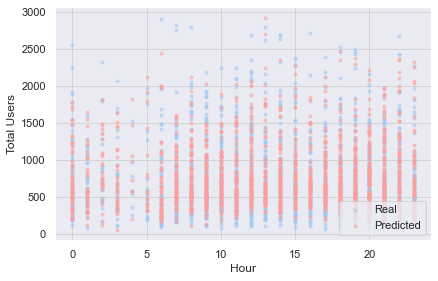

In [126]:
# Import library for visualization
import matplotlib.pyplot as plt

# Define x axis
x_axis = X_val.hour

# Build scatterplot
plt.scatter(x_axis, 
            y_val, 
            c = 'b', 
            alpha = 0.5, 
            marker = '.', 
            label = 'Real')

plt.scatter(x_axis, 
            XG_predictions, 
            c = 'r', 
            alpha = 0.5, 
            marker = '.', 
            label = 'Predicted')

plt.xlabel('Hour')
plt.ylabel('Total Users')
plt.grid(color = '#D3D3D3', 
         linestyle = 'solid')
plt.legend(loc = 'lower right')
plt.show()

### Random Forest Feature Elimination

In [143]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from scipy.stats import uniform, randint
from sklearn.model_selection import RandomizedSearchCV
RandomForestRegressor()

RandomForestRegressor()

In [147]:
#import libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import permutation_importance

#set and fit the Regressor
rf = RandomForestRegressor(n_estimators=100)
rf.fit(X_train, y_train)

RandomForestRegressor()

In [148]:
#sort the values based on their importance
rf_important = pd.Series(rf.feature_importances_, 
                         index=X_train.columns,)
rf_important.sort_values(ascending=False)

end_Longitude                         0.209656
start_Longitude                       0.205463
start_Latitude                        0.178895
end_Latitude                          0.172257
hour                                  0.037517
wea_temp                              0.022632
wea_humidity                          0.020646
wea_dptemp                            0.020505
day                                   0.019463
wea_windspeed                         0.015852
wea_pressure                          0.014881
weekday                               0.014871
wea_winddir                           0.010647
month                                 0.009315
num_packages                          0.007415
wea_visibility                        0.005683
peak_workingday                       0.004437
season                                0.002815
wea_conditions_Clear                  0.002812
wea_conditions_Overcast               0.002545
model_van_model_B                     0.002224
wea_condition

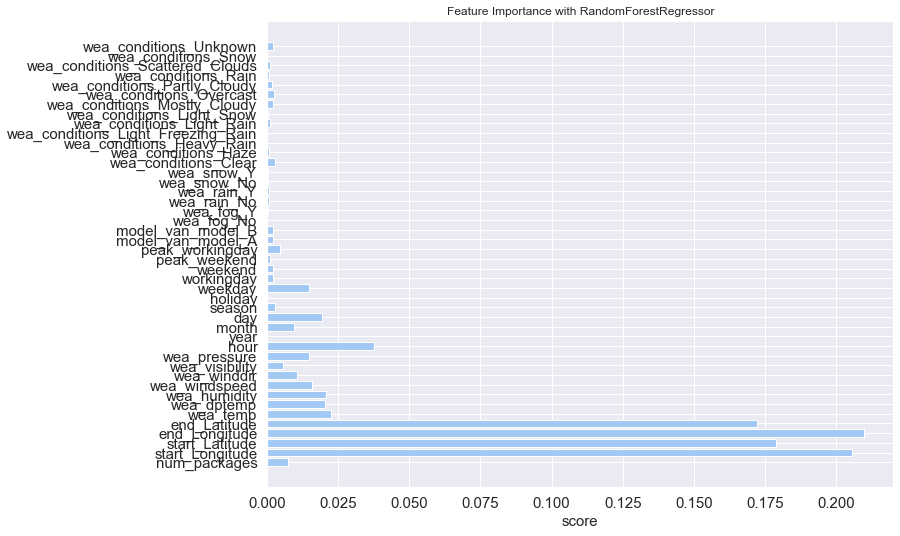

In [150]:
#plot for a better view
plt.figure(figsize=(10,8));
plt.barh(X_train.columns, rf_important);
plt.title("Feature Importance with RandomForestRegressor")
plt.xlabel("score",fontsize = 15);
plt.xticks(fontsize=15);
plt.yticks(fontsize=15);

In [149]:
#import libraries
from sklearn.feature_selection import RFE           
import xgboost

# feature extraction with XGBRegressor
model_rfe = xgboost.XGBRegressor()       
rfe1 = RFE(model_rfe, 40)                              
fit_rfe = rfe1.fit(X_train, y_train)
print("Num Features: %d" % fit_rfe.n_features_)
print("Selected Features: %s" % fit_rfe.support_)
print("Feature Ranking: %s" % fit_rfe.ranking_)

Num Features: 40
Selected Features: [ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True False  True  True  True
  True  True False  True False  True False  True  True  True  True  True
  True  True  True  True  True  True  True  True]
Feature Ranking: [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 3 1 1 1 1 1 2 1 4 1 5 1 1 1 1 1 1
 1 1 1 1 1 1 1]


In [141]:
#apply the selected features given as numpy array to the dataset (X) to extract the most important features by name
selected_cols = fit_rfe.support_
X_train.iloc[:, selected_cols].columns

Index(['num_packages', 'delivery_time', 'start_Latitude', 'end_Longitude',
       'end_Latitude', 'wea_temp', 'wea_dptemp', 'wea_humidity',
       'wea_windspeed', 'wea_pressure', 'hour', 'month', 'day', 'weekday',
       'peak_workingday', 'model_van_model_A', 'wea_rain_No',
       'wea_conditions_Clear', 'wea_conditions_Mostly_Cloudy',
       'wea_conditions_Partly_Cloudy'],
      dtype='object')

In [ ]:
xgb_train = X_train[['delivery_time', 'start_Latitude', 'end_Latitude', 'wea_temp',
       'wea_humidity', 'wea_windspeed', 'hour', 'month', 'day',
       'wea_conditions_Partly_Cloudy']]
xgb_test = Xtest[['temp', 'apparent_temp', 'light', 'hour', 'year', 'season', 'holiday','daylight', 
                   'peak_weekend', 'peak_workingday', 'windspeed', 'month', 'weekday', 'day']]